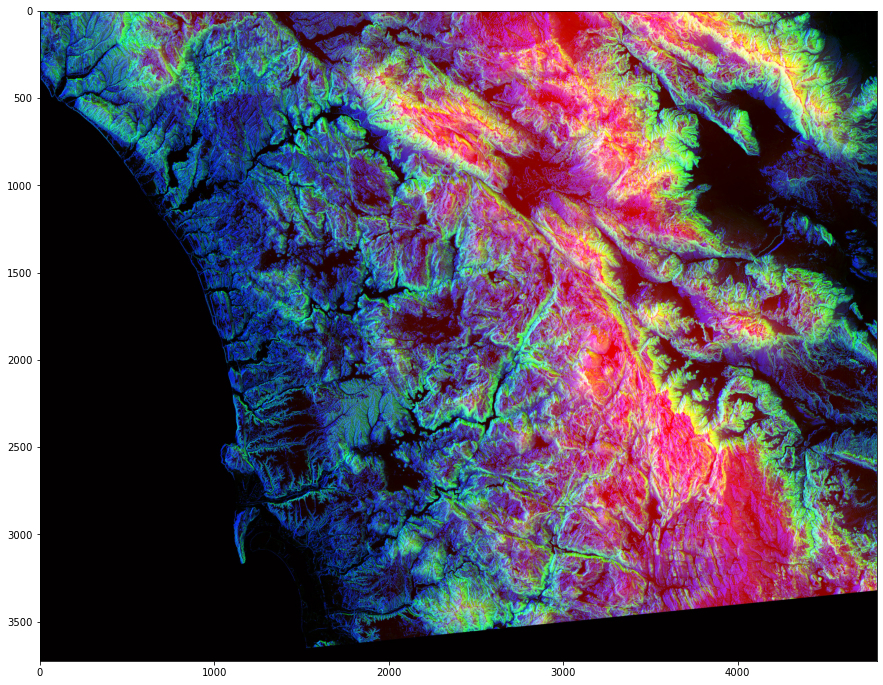

In [1]:
'''Data Source: Satellite Image from WIFIRE Project
WIFIRE is an integrated system for wildfire analysis, with specific regard to changing urban dynamics and climate. 
The system integrates networked observations such as heterogeneous satellite data and real-time remote sensor data, 
with computational techniques in signal processing, visualization, modeling, and data assimilation to provide a scalable 
method to monitor such phenomena as weather patterns that can help predict a wildfire's rate of spread.
RGB Color Mapping in the Photo:
- RED pixel indicates Altitude
- BLUE pixel indicates Aspect
- GREEN pixel indicates Slope
The higher values denote higher altitude, aspect and slope.
In this example, we will analyze a sample satellite image dataset from WIFIRE using the numpy Library.'''

import numpy as np
import scipy
import imageio
import matplotlib.pyplot as plt
import skimage
import warnings 
warnings.filterwarnings("ignore")

#Creating a numpy array from an image file: 
#Lets choose a WIFIRE satellite image file as an ndarray and display its type

from skimage import data 
photo_data = imageio.imread('data/sd-3layers.jpg') 
type(photo_data)

#Let us see what is in this image. 
plt.figure(figsize=(15,15)) 
plt.imshow(photo_data) 
plt.show()

In [2]:
#Let us see how does the photo_data looks like:
print(photo_data)

[[[  0  22  35]
  [  0  11  57]
  [ 19  32 128]
  ...
  [ 19  21  98]
  [  0   6  28]
  [  0  19   0]]

 [[ 30  64 109]
  [ 29  46 128]
  [ 25  33 157]
  ...
  [  1   5  50]
  [  0   5  34]
  [  0   4  28]]

 [[ 23  57 155]
  [ 16  35 174]
  [ 15  24 189]
  ...
  [  0   5   9]
  [  0   5  34]
  [  0   2  69]]

 ...

 [[  2   0   1]
  [  2   0   1]
  [  2   0   1]
  ...
  [  2   0   1]
  [  2   0   1]
  [  2   0   1]]

 [[  2   0   1]
  [  2   0   1]
  [  2   0   1]
  ...
  [  2   0   1]
  [  2   0   1]
  [  2   0   1]]

 [[  2   0   1]
  [  2   0   1]
  [  2   0   1]
  ...
  [  2   0   1]
  [  2   0   1]
  [  2   0   1]]]


In [3]:
#Let us print the shape of photo_data
print(photo_data.shape)

(3725, 4797, 3)


In [4]:
#The shape of the ndarray show that it is a three layered matrix. 
# The first two numbers here are length and width, and 
# the third number (i.e. 3) is for three layers: Red, Green and Blue. 
#RGB Color Mapping in the Photo: 
#RED pixel indicates Altitude 
#BLUE pixel indicates Aspect 
#GREEN pixel indicates Slope 
#The higher values denote higher altitude, aspect and slope.

photo_data.size # Data Size

53606475

In [5]:
photo_data.min(), photo_data.max() # Maximum and Minimum of the pixel value

(0, 255)

In [6]:
photo_data.mean() # Average Pixel Value

75.8299354508947

In [7]:
#Pixel on the 150th Row and 250th Column: 
photo_data[150, 250] # It will print the Red, Green , Blue Value in order 

Array([ 17,  35, 255], dtype=uint8)

In [8]:
photo_data[150, 250, 1] # It will print out the Green Value

35

In [9]:
#Pixel on the 2nd Row and 2nd Column: 
photo_data[1, 1] # It will print the Red, Green, Blue Value in order

Array([ 29,  46, 128], dtype=uint8)

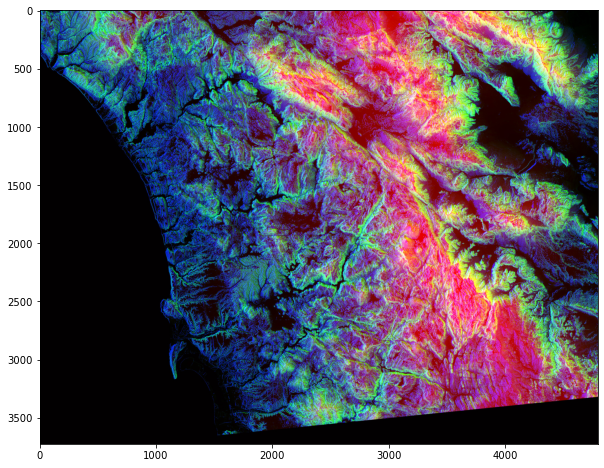

In [10]:
#Set a Pixel to All Zeros
#We can set all three layer in a pixel as once by assigning zero globally to that
# (row,column) pairing. However, setting one pixel to zero is not noticeable.

photo_data = imageio.imread('data/sd-3layers.jpg') 
photo_data[150, 250] = 0 # We set all three layers of RGB of this 
plt.figure(figsize=(10,10)) 
plt.imshow(photo_data)
plt.show()

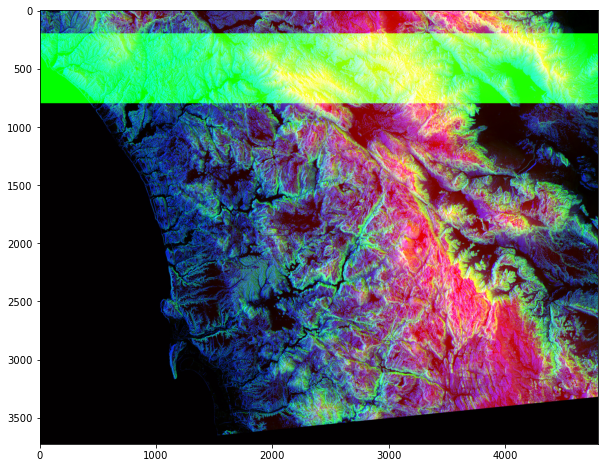

In [11]:
#Changing colors in a Range 
#We can also use a range to change the pixel values. As an example, 
# let us set the green layer for rows 200 to 800 to full intensity.
#We will set the value of Green layer to full intensity for rows 200(inclusive)
# to 800 (exclusive) for all the columns.

photo_data = imageio.imread('data/sd-3layers.jpg') 
photo_data[200:800, : ,1] = 255 
plt.figure(figsize=(10,10)) 
plt.imshow(photo_data) 
plt.show()

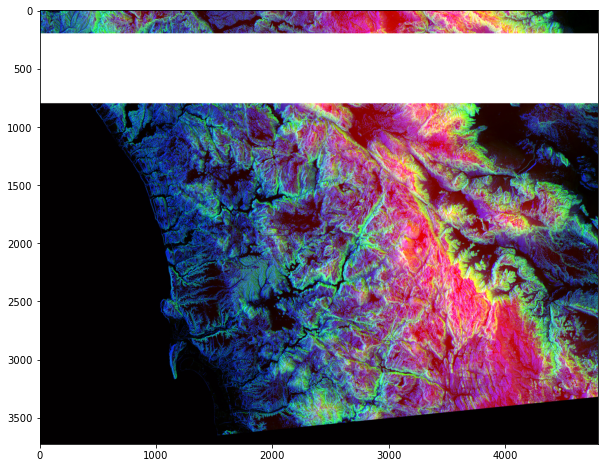

In [12]:
#We will set the value of Red, Green and Blue layer to full intensity 
# (we will get a white block) for rows 200 (inclusive) to 800 (exclusive) for all the columns.

photo_data = imageio.imread('data/sd-3layers.jpg') 
photo_data[200:800, :] = 255 
plt.figure(figsize=(10,10)) 
plt.imshow(photo_data) 
plt.show()

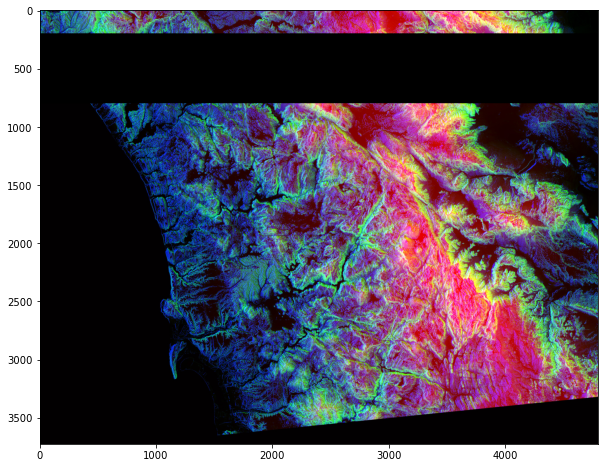

In [13]:
#We will set the value of Red, Green and Blue layer to least intensity 
# (we will get a black block) for rows 200 (inclusive) to 800 (exclusive) for all the columns.

photo_data = imageio.imread('data/sd-3layers.jpg') 
photo_data[200:800, :] = 0
plt.figure(figsize=(10,10)) 
plt.imshow(photo_data) 
plt.show()

In [14]:
#Pick all Pixels with Low Values
photo_data = imageio.imread('data/sd-3layers.jpg') 
print("Shape of photo_data:", photo_data.shape)

Shape of photo_data: (3725, 4797, 3)


In [15]:
low_value_filter = photo_data < 100 #Create a boolean array with the same shape as of photo_data 
print("Shape of low_value_filter:", low_value_filter.shape)

Shape of low_value_filter: (3725, 4797, 3)


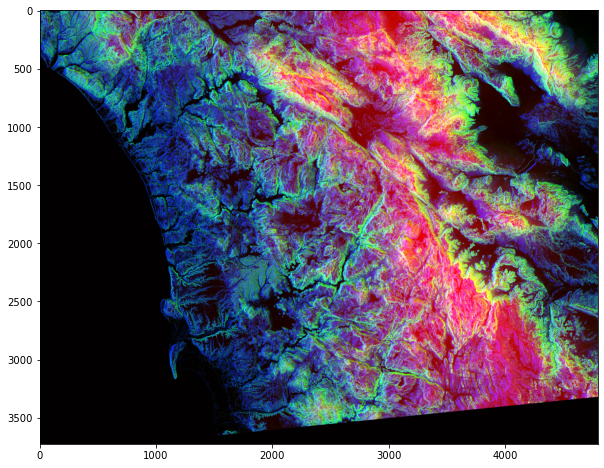

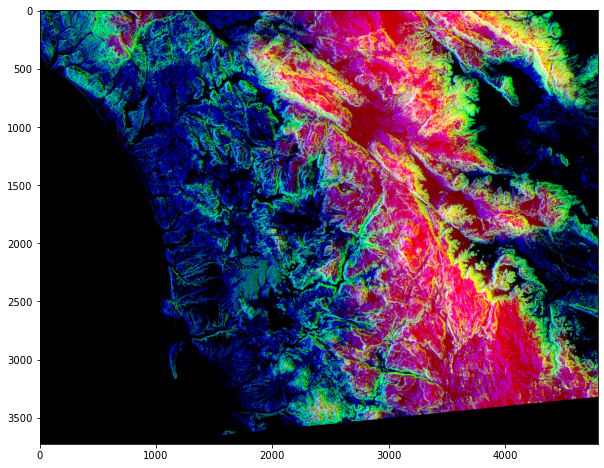

In [16]:
#Filtering Out Low Values: 
#Whenever the low_value_filter is True, set value to 0.
plt.figure(figsize=(10,10)) 
plt.imshow(photo_data) 
photo_data[low_value_filter] = 0 #set low values to 0 
plt.figure(figsize=(10,10)) 
plt.imshow(photo_data) 
plt.show()

In [17]:
#More Row and Column Operations 
#We can design complex patterns by making columns a function 
# of rows or vice-versa. Here we try a linear relationship between rows and columns.

rows_range = np.arange(len(photo_data)) #Create a range array 
print(rows_range) 
cols_range = rows_range #Create a range array 
print(cols_range) 
print(type(rows_range))

[   0    1    2 ... 3722 3723 3724]
[   0    1    2 ... 3722 3723 3724]
<class 'numpy.ndarray'>


[[[255 255 255]
  [  0   0   0]
  [  0   0 128]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0 109]
  [255 255 255]
  [  0   0 157]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0 155]
  [  0   0 174]
  [255 255 255]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]


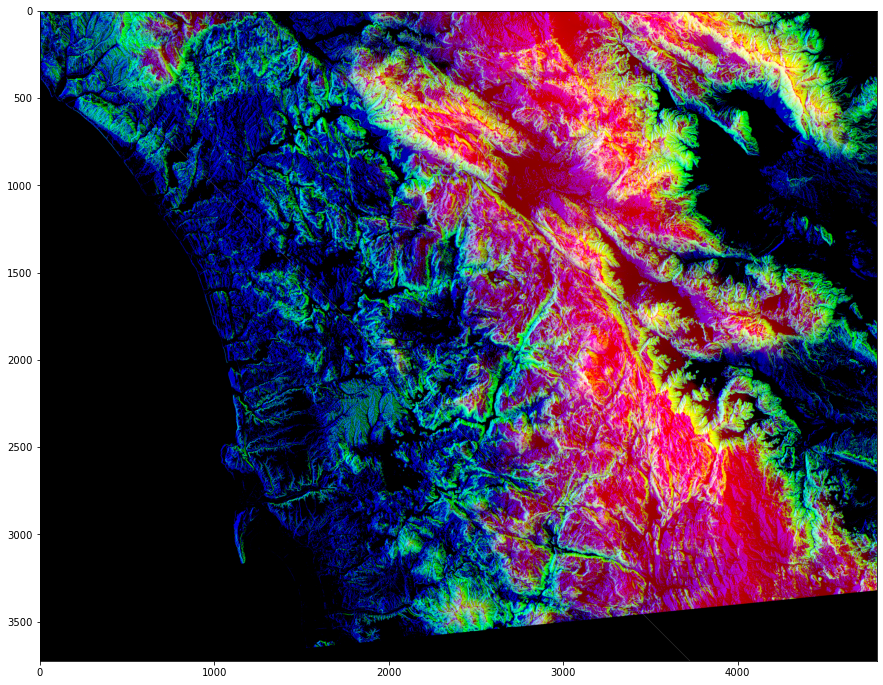

In [18]:
#We are setting the selected rows and columns to the maximum value of 255

photo_data[rows_range, cols_range] = 255 
print(photo_data) 
plt.figure(figsize=(15,15)) 
plt.imshow(photo_data) 
plt.show() 
#We see a diagonal white line that is a result of our operation.

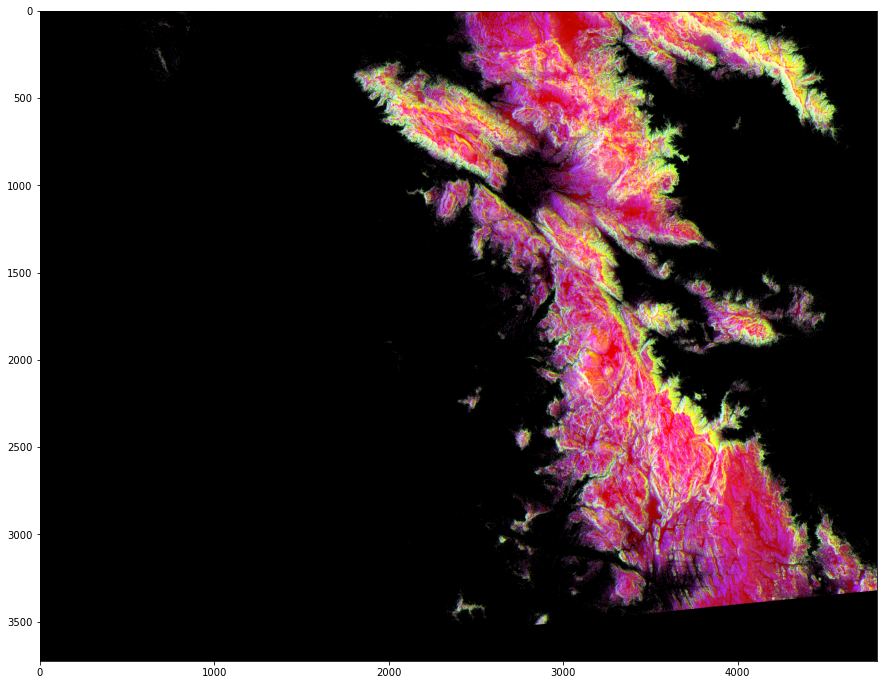

In [19]:
#Further Processing of our Satellite Imagery
# * Processing of RED Pixels
# * Remember that red pixels tell us about the height. 
# Let us try to highlight all the high altitude areas. 
# We will do this by detecting high intensity RED Pixels and muting down other areas.

photo_data = imageio.imread('data/sd-3layers.jpg') 
red_mask = photo_data[:, : ,0] < 150 
photo_data[red_mask] = 0 
plt.figure(figsize=(15,15)) 
plt.imshow(photo_data) 
plt.show()

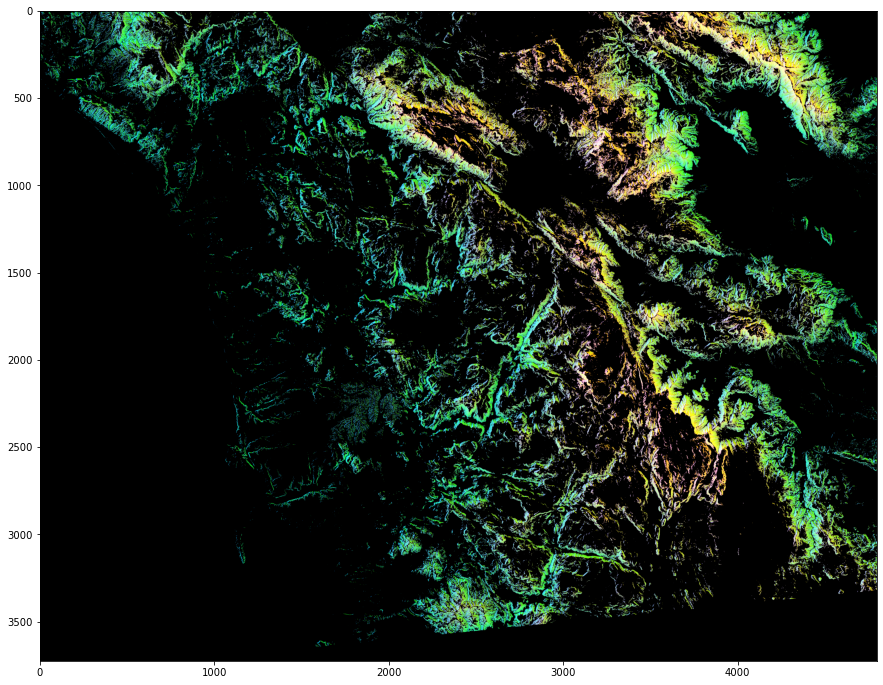

In [20]:
#Detecting Highl-GREEN Pixels 
photo_data = imageio.imread('data/sd-3layers.jpg') 
green_mask = photo_data[:, : ,1] < 150 
photo_data[green_mask] = 0 
plt.figure(figsize=(15,15)) 
plt.imshow(photo_data)
plt.show()

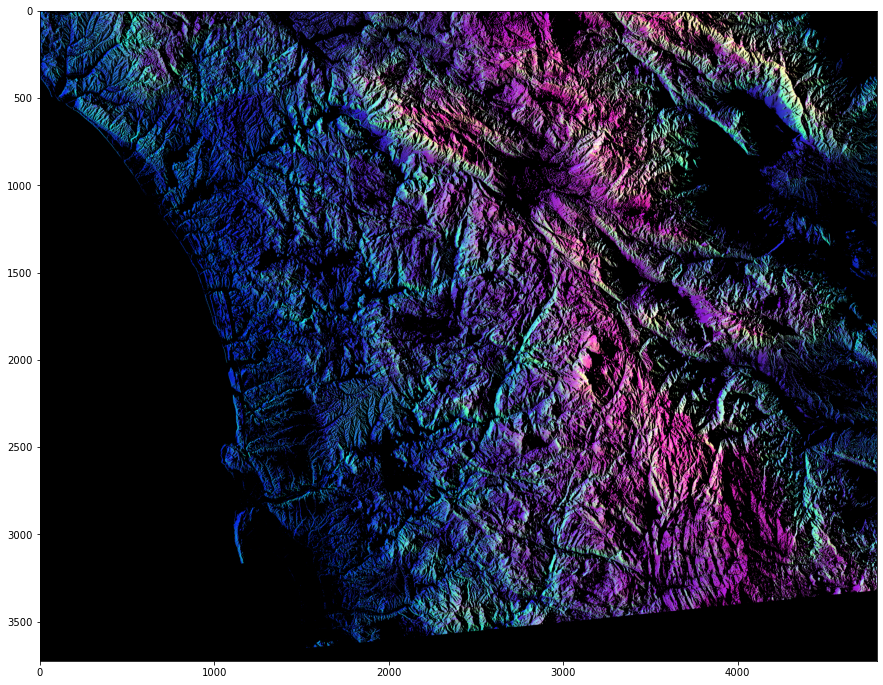

In [21]:
#Detecting Highly-BLUE Pixels 
photo_data = imageio.imread('data/sd-3layers.jpg') 
blue_mask = photo_data[:, : ,2] < 150 
photo_data[blue_mask] = 0 
plt.figure(figsize=(15,15)) 
plt.imshow(photo_data)
plt.show()

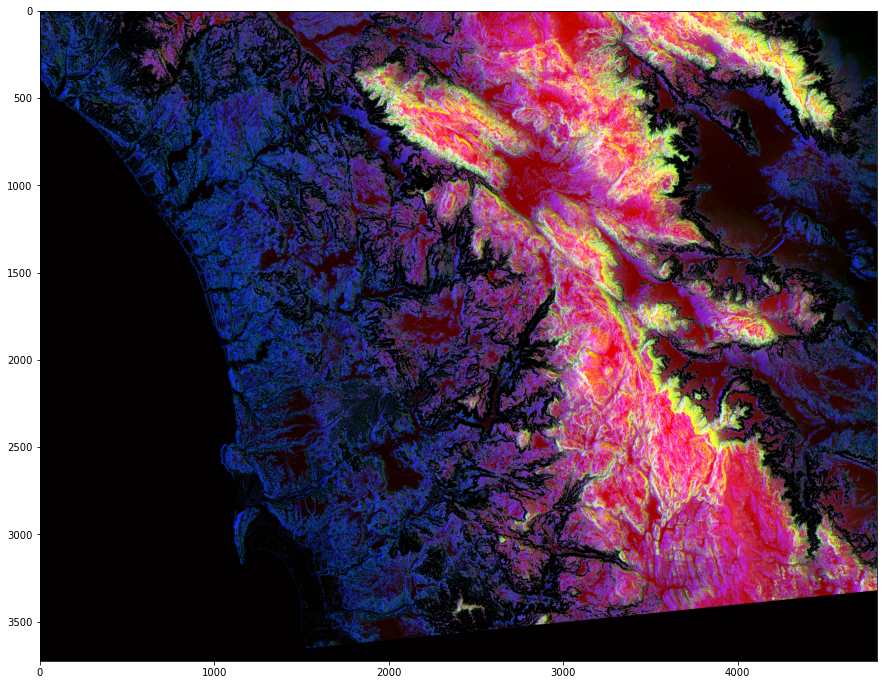

In [22]:
#Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE 
photo_data = imageio.imread('data/sd-3layers.jpg') 
red_mask = photo_data[:, : ,0] < 150 
green_mask = photo_data[:, : ,1] > 100 
blue_mask = photo_data[:, : ,2] < 100 
final_mask = np.logical_and(red_mask, green_mask, blue_mask) 
photo_data[final_mask] = 0 
plt.figure(figsize=(15,15)) 
plt.imshow(photo_data) 
plt.show()